In [12]:
from IPython.display import HTML, display, Image

# set path containing data folder or use default for Colab (/gdrive/My Drive)
local_folder = "../"
import urllib.request
urllib.request.urlretrieve('https://raw.githubusercontent.com/guiwitz/DLImaging/master/utils/check_colab.py', 'check_colab.py')
from check_colab import set_datapath
colab, datapath = set_datapath(local_folder)

# 13. Segmentation

Unitl now we have only explored and trained with neural networks designed for classification. Another major application of neural networks in imaging is *segmentation*, the dense (each pixel assigned to a class) labelling of images. Segmentation is widely used in many areas, in paticular in biomedical research (e.g. tumor segmentation) and geography (identification of buildings, fields etc.).

## Changes compared to classification

The main difference with classification is that the output of the neural network is not a list of weights for each category but an actual image with the same size as the original. Therefore we also have to change the way we calculate the loss. For example if we want to segment our image into three categories, e.g. triangle, disk, background, we will get for each pixel a list of 3 elements on which to apply cross entropy loss as before. These 3 values are still organised into image, with each output image corresponding a probability map of a given label, as illustrated below.

In [11]:
HTML(datapath.joinpath('illustrations/segmentation.html').as_posix())

As we work with batches, the network should generate a tensor of size ```B x C x H x W``` where ```B``` is batch size, ```C``` the number of classes and ```H, W``` image dimensions. Cross entropy loss is then applied on the ```C``` dimension *for each pixel*. The *target label* here is of course also a batch of images of size ```B x H x W``` where each pixel has a value in the range ```[0, C-1]``` defining the class of that pixel.

## Synthetic data

To keep a simple a full control over the dataset, we are here again using a synthetic dataset. We generated images containing both circles and trianlges as well as a lable map:

In [81]:
from pathlib import Path
import skimage.io
import matplotlib.pyplot as plt

im_path = datapath.joinpath('data/triangle_circle_seg/images')
lab_path = datapath.joinpath('data/triangle_circle_seg/labels')

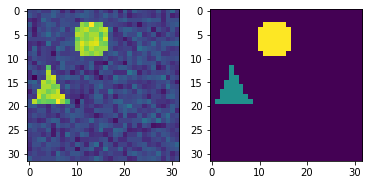

In [82]:
fig, ax = plt.subplots(1,2)
ax[0].imshow(skimage.io.imread(im_path.joinpath(f'image_1.tif')))
ax[1].imshow(skimage.io.imread(lab_path.joinpath(f'labels_1.tif')))

In [85]:
len(list(im_path.glob('*.tif')))

1000

In [39]:
import torch 
from skimage.draw import random_shapes
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader, random_split
from torch.functional import F
from pytorch_lightning.loggers import TensorBoardLogger
import pytorch_lightning as pl

import numpy as np

## Importing data

Let's write an importer for the images availabel in the ```data/triangle_circle``` folder. This time we won't import all data at once but successively as batches. This is typical of how imaging data, which tend to be large, are used in DL. Therefore this time our ```Dataset``` will not take actual data as input but a path where to find them, and the actual import will happen within the ```Dataset```.

We import here our data using ```skimage.io``` generating Numpy arrays. Those have of course to be converted. We could do it using ```torch.tensor``` but we use here a more general approach defining a ```transform``` step. Here it only contains a conversion ```ToTensor``` but it could also contain image augmentations.

In [23]:
transform = transforms.Compose([transforms.ToTensor()])

In [25]:
class Segdata(Dataset):
    def __init__(self, im_path, label_path, transform=None):
        super(Segdata, self).__init__()
        self.im_path = im_path
        self.label_path = label_path
        self.transform = transform

    def __getitem__(self, index):
        
        x = skimage.io.imread(self.im_path.joinpath(f'image_{index}.tif'))
        if self.transform is not None:
            x = self.transform(x)
        
        y = skimage.io.imread(self.label_path.joinpath(f'labels_{index}.tif'))
        y = torch.tensor(y, dtype=torch.int64)
        
        return x, y

    def __len__(self):

        return len(list(im_path.glob('*.tif')))
    
segdata = Segdata(im_path, lab_path, transform)
train_size = int(0.8 * len(segdata))
valid_size = len(segdata)-train_size

train_data, valid_data = random_split(segdata, [train_size, valid_size])
train_loader = DataLoader(train_data, batch_size=10)
validation_loader = DataLoader(valid_data, batch_size=10)

Let's verify that we get the expected data sizes:

In [26]:
im_batch, lab_batch = next(iter(train_loader))

In [29]:
im_batch.shape

torch.Size([10, 1, 32, 32])

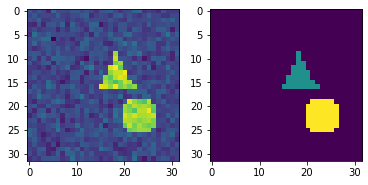

In [30]:
fig, ax = plt.subplots(1,2)
ax[0].imshow(im_batch[0,0,:,:])
ax[1].imshow(lab_batch[0,:,:]);

## Segmentation accuracy

For the loss we can still use cross-entropy here but in a *pixel-wise* manner. To get a more intuitive feeling of the quality of our segmentation we however need some other measures. Before, we simply used accuary. We could measure average pixel classification accuracy. However this can create problems. Imagine that we are trying to identify a small object in a large image: then by setting all pixels to background, we would obtain a reasonable accuaracy! Conversely, if we only focus on the object to detect, we could set the entire image to *object* and reach perfect accuary. We therefore have to find a measure that more accurately takes into account true and false positives of the segmentation object.

## Jaccard's index

One such measure is the Jaccard index which compares the fraction of labelling that matches compared to the total area covered by the reference and predicted label as illustrated below:

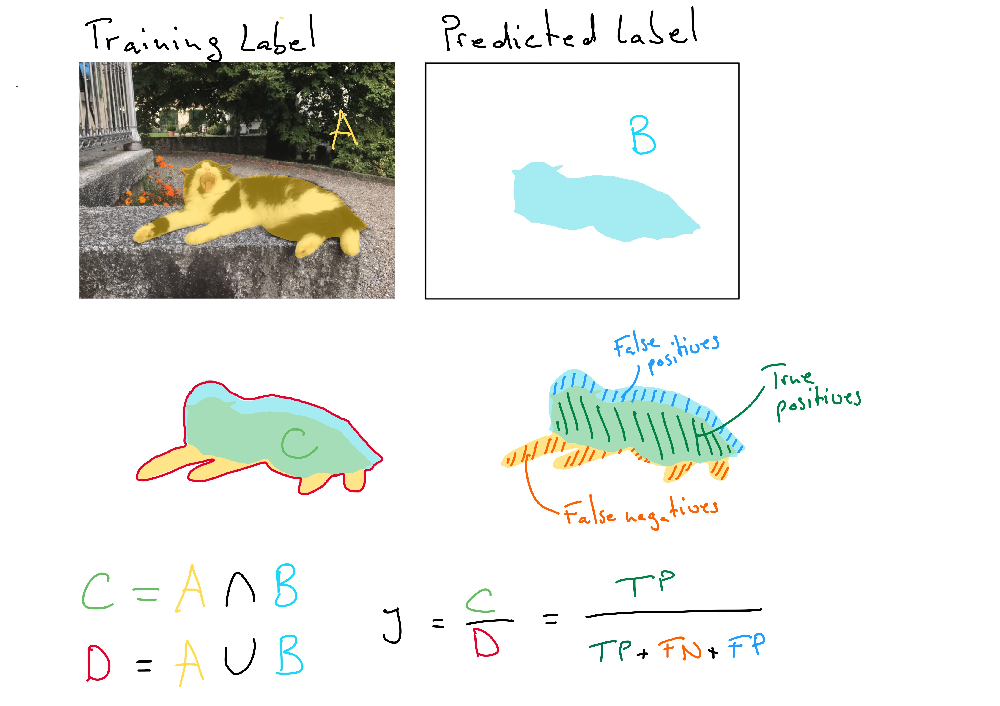

In [35]:
Image(filename=datapath.joinpath('illustrations/Jaccard.jpg'),width=700)

We will here simply use the scikit-learn implementation:

In [36]:
from sklearn.metrics import jaccard_score

## Define the network

We start here with a very simple network composed of two convolutional layers, the last one resulting in ```num_categories``` channels corresponding to our categories.

In [63]:
from torch import nn

class Mynetwork(pl.LightningModule):
    def __init__(self, num_categories):
        super(Mynetwork, self).__init__()
        
        # define e.g. layers here e.g.
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=20, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=20, out_channels=num_categories, kernel_size=3, padding=1)
        self.loss = nn.CrossEntropyLoss()

    def forward(self, x):
        
        # define the sequence of operations in the network including e.g. activations
        x = F.relu(self.conv1(x))
        x = self.conv2(x)
                
        return x
    
    def training_step(self, batch, batch_idx):
        
        x, y = batch
        output = self(x)
        loss = self.loss(output, y)
        
        #self.log('Loss/Train', loss, on_epoch=True, prog_bar=True)
        self.logger.experiment.add_scalar("Loss/Train", loss, self.current_epoch)

        return loss
    
    def validation_step(self, batch, batch_idx):
        
        x, y = batch
        output = self(x)
        output_proj = output.argmax(dim=1)
        jaccard = jaccard_score(y.view(-1), output_proj.view(-1), average='macro')

        #self.log('Jaccard/Valid', jaccard, on_epoch=True, prog_bar=True)
        self.logger.experiment.add_scalar("Jaccard/Valid", jaccard, self.current_epoch)

        return jaccard
        
    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=1e-3)

## Training

Now we can train our model as usual:

In [64]:
del model
model = Mynetwork(3)

In [65]:
logger = TensorBoardLogger("tb_logs", name="triangle_seg")
trainer = pl.Trainer(max_epochs=10, logger=logger)

GPU available: False, used: False
TPU available: None, using: 0 TPU cores


In [66]:
trainer.fit(model, train_dataloader=train_loader, val_dataloaders=validation_loader)


  | Name  | Type             | Params
-------------------------------------------
0 | conv1 | Conv2d           | 200   
1 | conv2 | Conv2d           | 543   
2 | loss  | CrossEntropyLoss | 0     
-------------------------------------------
743       Trainable params
0         Non-trainable params
743       Total params
/Users/gw18g940/miniconda3/envs/CASImaging/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:49: UserWarning: The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


Validation sanity check: 0it [00:00, ?it/s]

/Users/gw18g940/miniconda3/envs/CASImaging/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:49: UserWarning: The dataloader, train dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

1

In [41]:
%load_ext tensorboard
%tensorboard --logdir tb_logs

Reusing TensorBoard on port 6006 (pid 588), started 1 day, 0:05:18 ago. (Use '!kill 588' to kill it.)

We see that we don't get beyond an accuracy of ~0.6. Let's check on of the training samples to undertand what is happening:

In [102]:
index = 102
test_image = skimage.io.imread(im_path.joinpath(f'image_{index}.tif'))
test_label = skimage.io.imread(lab_path.joinpath(f'labels_{index}.tif'))

In [103]:
output = model(transform(test_image).unsqueeze(dim=0))
proj= output.argmax(dim=1)

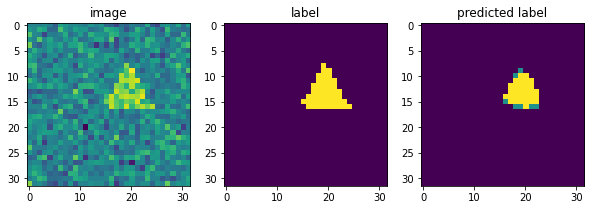

In [104]:
fig, ax = plt.subplots(1,3, figsize=(10,3))
ax[0].imshow(test_image)
ax[0].set_title('image')
ax[1].imshow(test_label)
ax[1].set_title('label')
ax[2].imshow(proj[0])
ax[2].set_title('predicted label');

We clearly see that the objects are identified, but the network has a difficult time "seeing" that the triangle is a triangle. Instead it recognizes the triangle's vertices but assumes the inner part of the triangle is a circle.

Clearly the network lacks the ability to "see" at a larger scale. This is easy to understand as we use a kernel of size 2 and never rescale the image. The network just never sees larger scale object!

We can now try to improve the network by adding a downscaling step. Of course if we want to recover a segmentation of the original image size, we also then need to add an upscaling step. We can for example:
- add a a max pooling after the convolution
- add another convolution layer
- upsample the result

As previously we do the upsampling using a transpose convolution which "reverses" the effect of the convolution.

In [67]:
class Mynetwork(pl.LightningModule):
    def __init__(self, num_categories):
        super(Mynetwork, self).__init__()
        
        # define e.g. layers here e.g.
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=20, kernel_size=3, padding=1)
        self.maxpool = nn.MaxPool2d(kernel_size=2)
        self.conv2 = nn.Conv2d(in_channels=20, out_channels=20, kernel_size=3, padding=1)
        self.upscale = nn.ConvTranspose2d(20, 20, kernel_size=2, stride=2)
        self.conv3 = nn.Conv2d(in_channels=20, out_channels=3, kernel_size=3, padding=1)
        self.loss = nn.CrossEntropyLoss()

    def forward(self, x):
        
        # define the sequence of operations in the network including e.g. activations
        x = F.relu(self.conv1(x))
        x = self.maxpool(x)
        x = F.relu(self.conv2(x))
        x = F.relu(self.upscale(x))
        x = self.conv3(x)
                
        return x
    
    def training_step(self, batch, batch_idx):
        
        x, y = batch
        output = self(x)
        loss = self.loss(output, y)
        
        #self.log("Loss/Train", loss, on_epoch=True, prog_bar=True)
        self.logger.experiment.add_scalar("Loss/Train", loss, self.current_epoch)

        return loss
    
    def validation_step(self, batch, batch_idx):
        
        x, y = batch
        output = self(x)
        output_proj = output.argmax(dim=1)
        jaccard = jaccard_score(y.view(-1), output_proj.view(-1), average='macro')

        #self.log("Jaccard/Valid", jaccard, on_epoch=True, prog_bar=True)
        self.logger.experiment.add_scalar("Jaccard/Valid", jaccard, self.current_epoch)

        return jaccard
        
    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=1e-3)

In [69]:
del model
model = Mynetwork(3)

In [70]:
model

Mynetwork(
  (conv1): Conv2d(1, 20, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(20, 20, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (upscale): ConvTranspose2d(20, 20, kernel_size=(2, 2), stride=(2, 2))
  (conv3): Conv2d(20, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (loss): CrossEntropyLoss()
)

In [71]:
logger = TensorBoardLogger("tb_logs", name="triangle_seg_conv")
trainer = pl.Trainer(max_epochs=30, logger=logger)


GPU available: False, used: False
TPU available: None, using: 0 TPU cores


In [72]:
trainer.fit(model, train_dataloader=train_loader, val_dataloaders=validation_loader)


  | Name    | Type             | Params
---------------------------------------------
0 | conv1   | Conv2d           | 200   
1 | maxpool | MaxPool2d        | 0     
2 | conv2   | Conv2d           | 3.6 K 
3 | upscale | ConvTranspose2d  | 1.6 K 
4 | conv3   | Conv2d           | 543   
5 | loss    | CrossEntropyLoss | 0     
---------------------------------------------
6.0 K     Trainable params
0         Non-trainable params
6.0 K     Total params
/Users/gw18g940/miniconda3/envs/CASImaging/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:49: UserWarning: The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


Validation sanity check: 0it [00:00, ?it/s]

/Users/gw18g940/miniconda3/envs/CASImaging/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:49: UserWarning: The dataloader, train dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

1

We have already seen that the Jaccard accuracy has improved. Let's have a visual check:

In [73]:
output = model(transform(test_image).unsqueeze(dim=0))
proj= output.argmax(dim=1)

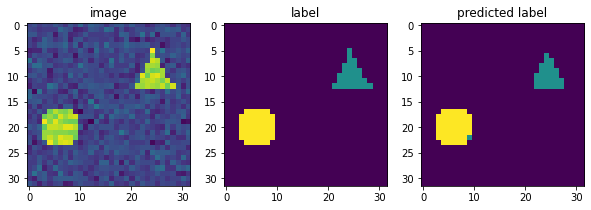

In [74]:
fig, ax = plt.subplots(1,3, figsize=(10,3))
ax[0].imshow(test_image)
ax[0].set_title('image')
ax[1].imshow(test_label)
ax[1].set_title('label')
ax[2].imshow(proj[0])
ax[2].set_title('predicted label');

We see that we now have successfully segmented all categories!

## Noisy example

We used here data that were relatively simple. To test the network, we can train it with a much noiser version of the images:

In [96]:
im_path = datapath.joinpath('data/triangle_circle_noisy_seg/images')
lab_path = datapath.joinpath('data/triangle_circle_noisy_seg/labels')

segdata = Segdata(im_path, lab_path, transform)
test_size = int(0.8 * len(segdata))
valid_size = len(segdata)-test_size

train_data, valid_data = random_split(segdata, [test_size, valid_size])
train_loader = DataLoader(train_data, batch_size=20)
validation_loader = DataLoader(valid_data, batch_size=20)

In [97]:
len(list(im_path.glob('*.tif')))

1000

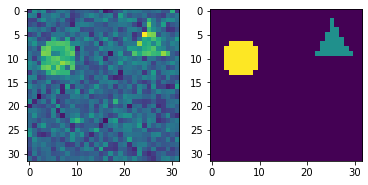

In [98]:
fig, ax = plt.subplots(1,2)
ax[0].imshow(skimage.io.imread(im_path.joinpath(f'image_3.tif')))
ax[1].imshow(skimage.io.imread(lab_path.joinpath(f'labels_3.tif')));

In [99]:
del model
model = Mynetwork(3)

In [100]:
logger = TensorBoardLogger("tb_logs", name="triangle_seg_noise")
trainer = pl.Trainer(max_epochs=30, logger=logger)

GPU available: False, used: False
TPU available: None, using: 0 TPU cores


In [101]:
trainer.fit(model, train_dataloader=train_loader, val_dataloaders=validation_loader)


  | Name    | Type             | Params
---------------------------------------------
0 | conv1   | Conv2d           | 200   
1 | maxpool | MaxPool2d        | 0     
2 | conv2   | Conv2d           | 3.6 K 
3 | upscale | ConvTranspose2d  | 1.6 K 
4 | conv3   | Conv2d           | 543   
5 | loss    | CrossEntropyLoss | 0     
---------------------------------------------
6.0 K     Trainable params
0         Non-trainable params
6.0 K     Total params
/Users/gw18g940/miniconda3/envs/CASImaging/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:49: UserWarning: The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


Validation sanity check: 0it [00:00, ?it/s]

/Users/gw18g940/miniconda3/envs/CASImaging/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:49: UserWarning: The dataloader, train dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

1

In [135]:
index = 106
test_image = skimage.io.imread(im_path.joinpath(f'image_{index}.tif'))
test_label = skimage.io.imread(lab_path.joinpath(f'labels_{index}.tif'))

In [136]:
output = model(transform(test_image).unsqueeze(dim=0))
proj= output.argmax(dim=1)

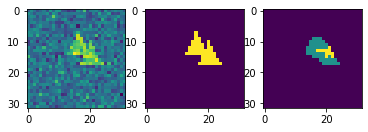

In [137]:
fig, ax = plt.subplots(1,3)
ax[0].imshow(test_image)
ax[1].imshow(test_label)
ax[2].imshow(proj[0])

### Deeper network

We can try to add more convolution/maxpooling layers:

In [111]:
class Mynetwork(pl.LightningModule):
    def __init__(self, num_categories):
        super(Mynetwork, self).__init__()
        
        # define e.g. layers here e.g.
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=20, kernel_size=3, padding=1)
        self.maxpool1 = nn.MaxPool2d(kernel_size=2)
        self.conv2 = nn.Conv2d(in_channels=20, out_channels=20, kernel_size=3, padding=1)
        self.maxpool2 = nn.MaxPool2d(kernel_size=2)
        self.conv3 = nn.Conv2d(in_channels=20, out_channels=20, kernel_size=3, padding=1)
        self.upscale1 = nn.ConvTranspose2d(20, 20, kernel_size=2, stride=2)
        self.upscale2 = nn.ConvTranspose2d(20, 20, kernel_size=2, stride=2)
        self.conv4 = nn.Conv2d(in_channels=20, out_channels=3, kernel_size=3, padding=1)
        self.loss = nn.CrossEntropyLoss()

    def forward(self, x):
        
        # define the sequence of operations in the network including e.g. activations
        x = F.relu(self.conv1(x))
        x = self.maxpool1(x)
        x = F.relu(self.conv2(x))
        x = self.maxpool2(x)
        x = self.conv3(x)
        x = F.relu(self.upscale1(x))
        x = F.relu(self.upscale2(x))
        x = self.conv4(x)
                
        return x
    
    def training_step(self, batch, batch_idx):
        
        x, y = batch
        output = self(x)
        loss = self.loss(output, y)
        
        #self.log("Loss/Train", loss, on_epoch=True, prog_bar=True)
        self.logger.experiment.add_scalar("Loss/Train", loss, self.current_epoch)

        return loss
    
    def validation_step(self, batch, batch_idx):
        
        x, y = batch
        output = self(x)
        output_proj = output.argmax(dim=1)
        jaccard = jaccard_score(y.view(-1), output_proj.view(-1), average='macro')

        #self.log("Jaccard/Valid", jaccard, on_epoch=True, prog_bar=True)
        self.logger.experiment.add_scalar("Jaccard/Valid", jaccard, self.current_epoch)

        return jaccard
        
    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=1e-3)

In [138]:
#del model
model = Mynetwork(3)

logger = TensorBoardLogger("tb_logs", name="triangle_seg_noise")
trainer = pl.Trainer(max_epochs=30, logger=logger)

trainer.fit(model, train_dataloader=train_loader, val_dataloaders=validation_loader)

GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name     | Type             | Params
----------------------------------------------
0 | conv1    | Conv2d           | 200   
1 | maxpool1 | MaxPool2d        | 0     
2 | conv2    | Conv2d           | 3.6 K 
3 | maxpool2 | MaxPool2d        | 0     
4 | conv3    | Conv2d           | 3.6 K 
5 | upscale1 | ConvTranspose2d  | 1.6 K 
6 | upscale2 | ConvTranspose2d  | 1.6 K 
7 | conv4    | Conv2d           | 543   
8 | loss     | CrossEntropyLoss | 0     
----------------------------------------------
11.2 K    Trainable params
0         Non-trainable params
11.2 K    Total params
/Users/gw18g940/miniconda3/envs/CASImaging/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:49: UserWarning: The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `

Validation sanity check: 0it [00:00, ?it/s]

/Users/gw18g940/miniconda3/envs/CASImaging/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:49: UserWarning: The dataloader, train dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

1

In [139]:
index = 106
test_image = skimage.io.imread(im_path.joinpath(f'image_{index}.tif'))
test_label = skimage.io.imread(lab_path.joinpath(f'labels_{index}.tif'))

In [140]:
output = model(transform(test_image).unsqueeze(dim=0))
proj= output.argmax(dim=1)

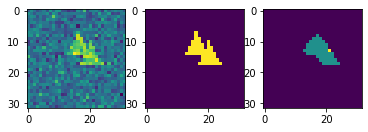

In [141]:
fig, ax = plt.subplots(1,3)
ax[0].imshow(test_image)
ax[1].imshow(test_label)
ax[2].imshow(proj[0])

We see that we somewhat reach better results but still far from optimal. In particular we see that we loose resolution, i.e. the objects become smoother and therefore it becomes harder to distinguish triangles from circles.